# Weapon Detection on Custom Dataset with Detectron2

[Dataset collected from](https://sci2s.ugr.es/weapons-detection).


## Detectron 2

<img src="https://www.curiousily.com/media/pytorch-02/detectron2-logo.png" width="55%">

[Detectron2](https://github.com/facebookresearch/detectron2) is a framework for building state-of-the-art object detection and image segmentation models. It is developed by the Facebook Research team. Detectron2 is a complete rewrite of the [first version](https://github.com/facebookresearch/Detectron).

Under the hood, Detectron2 uses PyTorch (compatible with the latest version(s)) and allows for [blazing fast training](https://detectron2.readthedocs.io/notes/benchmarks.html). You can learn more at [introductory blog post](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) by Facebook Research.

The real power of Detectron2 lies in the HUGE amount of pre-trained models available at the [Model Zoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md). But what good that would it be if you can't fine-tune those on your own datasets? Fortunately, that's super easy! We'll see how it is done in this guide.

### Installing Detectron2

At the time of this writing, Detectron2 is still in an alpha stage. While there is an official release, we'll clone and compile from the master branch. This should equal version 0.1.

Let's start by installing some requirements:

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

ModuleNotFoundError: No module named 'google.colab'

In [2]:
import os
#### code added below ####
os.chdir('/content/drive/My Drive/AIML/project')

FileNotFoundError: [WinError 3] The system cannot find the path specified: '/content/drive/My Drive/AIML/project'

In [3]:
!pip install -q cython pyyaml==5.3
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
#!pip install cython; 
#!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

ERROR: nxviz 0.6.1 requires sphinxcontrib-fulltoc==1.2.0, which is not installed.
ERROR: nxviz 0.6.1 has requirement cryptography==2.6.1, but you'll have cryptography 2.8 which is incompatible.
ERROR: nxviz 0.6.1 has requirement hypothesis==4.14.0, but you'll have hypothesis 5.8.3 which is incompatible.
ERROR: nxviz 0.6.1 has requirement matplotlib==3.0.3, but you'll have matplotlib 3.1.3 which is incompatible.
ERROR: nxviz 0.6.1 has requirement more-itertools==6.0.0, but you'll have more-itertools 8.2.0 which is incompatible.
ERROR: nxviz 0.6.1 has requirement networkx==2.2, but you'll have networkx 2.4 which is incompatible.
ERROR: nxviz 0.6.1 has requirement numpy==1.16.2, but you'll have numpy 1.18.1 which is incompatible.
ERROR: nxviz 0.6.1 has requirement palettable==3.1.1, but you'll have palettable 3.3.0 which is incompatible.
ERROR: nxviz 0.6.1 has requirement pandas==0.24.2, but you'll have pandas 1.0.3 which is incompatible.
ERROR: nxviz 0.6.1 has requirement pytest==4.3.1, 

And download, compile, and install the Detectron2 package:

In [4]:
#!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -q -e detectron2_repo

ERROR: detectron2_repo is not a valid editable requirement. It should either be a path to a local project or a VCS URL (beginning with svn+, git+, hg+, or bzr+).


In [5]:
#!chmod +x ./detectron2_repo/datasets/prepare_for_tests.sh
#import subprocess
#subprocess.call(['./detectron2_repo/datasets/prepare_for_tests.sh'])

> At this point, you'll need to restart the notebook runtime to continue!

In [6]:
!pip install -q -U watermark

In [3]:
%reload_ext watermark
%watermark -v -p numpy,pandas,pycocotools,torch,torchvision,detectron2

CPython 3.6.9
IPython 5.5.0

numpy 1.18.3
pandas 1.0.3
pycocotools 2.0
torch 1.5.0+cu101
torchvision 0.6.0+cu101
detectron2 0.1.1


In [1]:
import torch, torchvision
#import detectron2
#from detectron2.utils.logger import setup_logger
#setup_logger()

import glob

import os
import ntpath
import numpy as np
import cv2
import random
import itertools
import pandas as pd
from tqdm import tqdm
import urllib
import json
import PIL.Image as Image

#from detectron2 import model_zoo
#from detectron2.engine import DefaultPredictor, DefaultTrainer
#from detectron2.config import get_cfg, CfgNode
#from detectron2.utils.visualizer import Visualizer, ColorMode
#from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
#from detectron2.evaluation import COCOEvaluator, DatasetEvaluators, inference_on_dataset
#from detectron2.structures import BoxMode

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

In [4]:
import os
#### code added below ####
os.chdir('/content/drive/My Drive/BigData/weapons')

In [ ]:
os.

Let's load the file into a Pandas dataframe:

In [0]:
from zipfile import ZipFile

with ZipFile('WeaponS.zip', 'r') as z:
  z.extractall()

In [0]:
from zipfile import ZipFile

with ZipFile('WeaponS_bbox.zip', 'r') as z:
  z.extractall()

In [0]:
with ZipFile('Test.zip', 'r') as z:
  z.extractall()

In [0]:
os.getcwd()

## Data Preprocessing

Lets collect all annotations into a dataframe:

In [0]:
import xml.etree.ElementTree as ET


def read_content(xml_file: str):

    tree = ET.parse(xml_file)
    root = tree.getroot()

    list_with_all_boxes = []

    for boxes in root.iter('object'):

        filename = root.find('filename').text
        filename = f'{filename}.jpg'
        for size in root.iter('size'):
            width = int(size.find("width").text)
            height = int(size.find("height").text)
            
        class_name = boxes.find('name').text

        ymin, xmin, ymax, xmax = None, None, None, None

        for box in boxes.findall("bndbox"):
            data = {}
            data['file_name'] = filename
            data['width'] = width
            data['height'] = height
            data["x_min"] = int(box.find("xmin").text)
            data["y_min"] = int(box.find("ymin").text)
            data["x_max"] = int(box.find("xmax").text)
            data["y_max"] = int(box.find("ymax").text)
            data['class_name'] = class_name
            
        list_with_all_boxes.append(data)

    return list_with_all_boxes

In [0]:
import os

path = './WeaponS_bbox'

folder = os.fsencode(path)

filenames = []

for file in os.listdir(folder):
    filename = os.fsdecode(file)
    if filename.endswith( ('.xml') ): # whatever file types you're using...
        filenames.append(filename)

filenames.sort() 

In [53]:
len(filenames)

3000

In [55]:
dataset = []

for xmlfile in tqdm(filenames):
    dataSet = read_content(os.path.join(path, xmlfile))
    for data in dataSet:
        dataset.append(data)

100%|██████████| 3000/3000 [03:53<00:00, 12.85it/s]


Let's put the data into a dataframe so we can have a better look:

In [56]:
weapons_df = pd.DataFrame(dataset)
weapons_df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,armas (1).jpg,240,145,3,1,128,100,pistol
1,armas (1).jpg,240,145,123,47,238,145,pistol
2,armas (10).jpg,1300,913,409,95,697,352,pistol
3,armas (100).jpg,450,300,184,148,283,229,pistol
4,armas (1000).jpg,275,183,97,4,215,96,pistol


In [59]:
print(weapons_df.file_name.unique().shape[0], weapons_df.shape[0])

3000 3464


We have a total of 3000 images and 3464 annotations. Let's save them to the disk (so you might reuse them):

In [0]:
weapons_df.to_csv('weapons_anns.csv', header=True, index=None)

In [61]:
os.getcwd()

'/content/drive/My Drive/AIML/project'

In [0]:
os.makedirs("/content/drive/My Drive/AIML/project/weapons", exist_ok=True)

In [0]:
fileNames = list (weapons_df["file_name"].unique())
len(fileNames)

In [0]:
def process_img_data(data_df, data_path):
  data_df['new_file_name'] = None
  fileNames = list(data_df["file_name"].unique())
  for fileName in tqdm(fileNames):
    img = os.path.join(data_path, fileName)
    img = Image.open(img)
    img = img.convert('RGB')
    image_name = f'{fileName[:-4]}.jpeg'
    img.save(f'weapons/{image_name}', "JPEG")
    idx = (data_df['file_name']==fileName)
    data_df.loc[idx,'new_file_name'] = image_name

In [0]:
process_img_data(weapons_df,'WeaponS')

In [48]:
path = 'weapons'

folder = os.fsencode(path)

filenames = []

for file in os.listdir(folder):
  filenames.append(os.fsdecode(file))

len(filenames)

3000

In [66]:
weapons_df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,armas (1).jpeg,240,145,3,1,128,100,pistol
1,armas (1).jpeg,240,145,123,47,238,145,pistol
2,armas (10).jpeg,1300,913,409,95,697,352,pistol
3,armas (100).jpeg,450,300,184,148,283,229,pistol
4,armas (1000).jpeg,275,183,97,4,215,96,pistol


In [0]:
weapons_df.drop(['file_name'], axis=1, inplace=True)
weapons_df.rename(columns = {'new_file_name':'file_name'}, inplace = True)

In [0]:
weapons_df.head()

In [0]:
weapons_df = weapons_df[['file_name',	'width', 'height',	'x_min',	'y_min',	'x_max',	'y_max',	'class_name']]

In [0]:
weapons_df.head()

In [0]:
weapons_df.to_csv('anns_weapons.csv', header=True, index=None)

### Data Exploration

Let's see some sample annotated data. We'll use OpenCV to load an image, add the bounding boxes, and resize it. We'll define a helper function to do it all:

In [0]:
def annotate_image(annotations, resize=True):
  file_name = annotations.file_name.to_numpy()[0]
  img = cv2.cvtColor(cv2.imread(f'weapons/{file_name}'), cv2.COLOR_BGR2RGB)

  for i, a in annotations.iterrows():    
    cv2.rectangle(img, (a.x_min, a.y_min), (a.x_max, a.y_max), (0, 255, 0), 2)

  if not resize:
    return img

  return cv2.resize(img, (384, 384), interpolation = cv2.INTER_AREA)

In [68]:
img_df = weapons_df[weapons_df.file_name == weapons_df.file_name.unique()[0]]
img_df

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,armas (1).jpeg,240,145,3,1,128,100,pistol
1,armas (1).jpeg,240,145,123,47,238,145,pistol


Let's start by showing some annotated images:

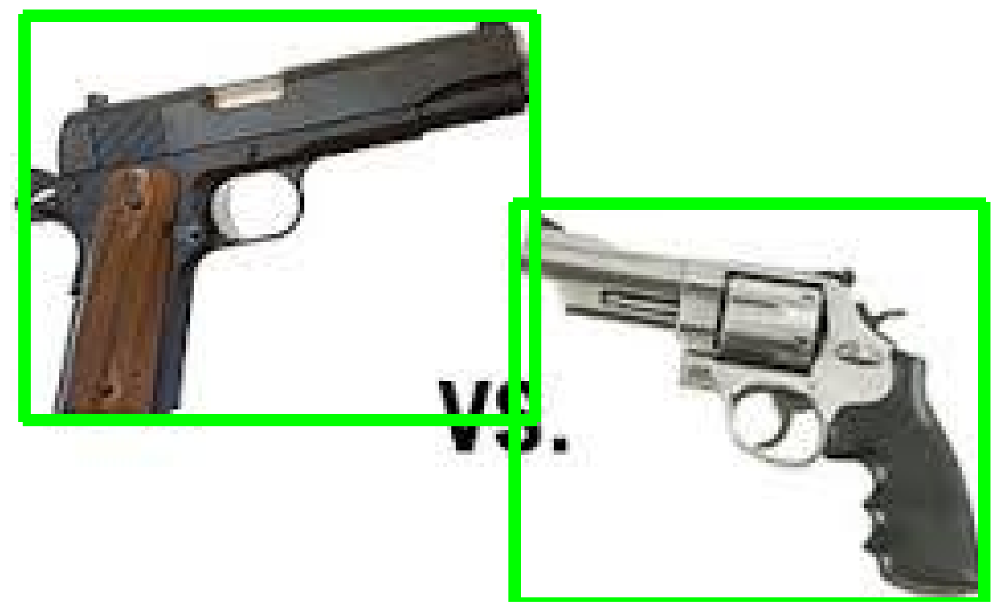

In [69]:
img_df = weapons_df[weapons_df.file_name == weapons_df.file_name.unique()[0]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

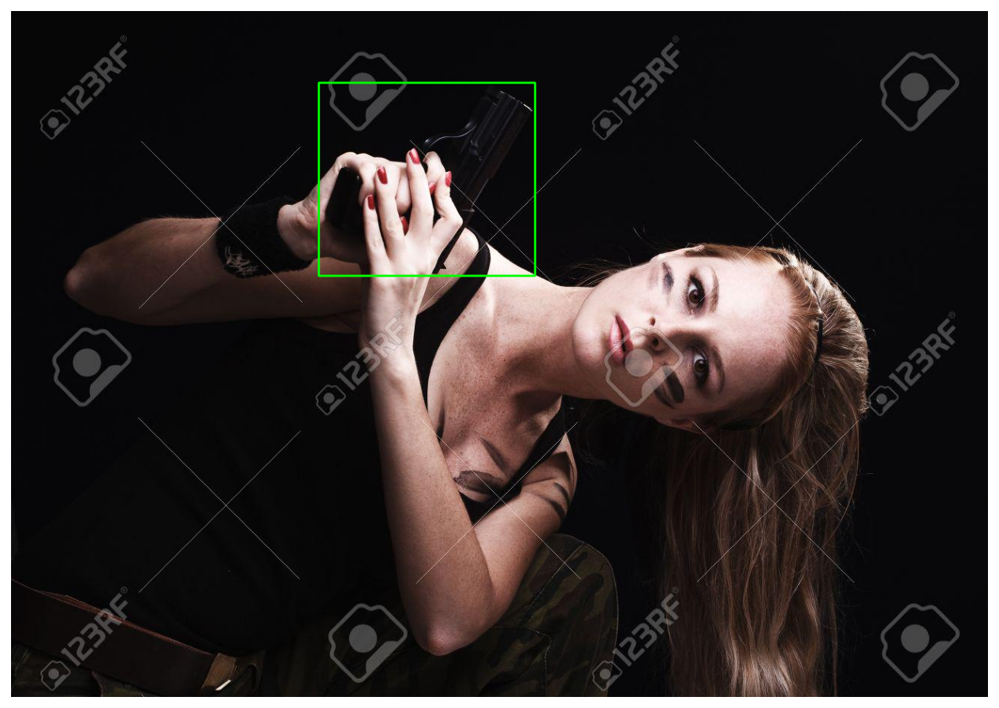

In [70]:
img_df = weapons_df[weapons_df.file_name == weapons_df.file_name.unique()[1]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

Those are good ones, the annotations are clearly visible. We can use torchvision to create a grid of images. Note that the images are in various sizes, so we'll resize them:

In [0]:
sample_images = [annotate_image(weapons_df[weapons_df.file_name == f]) for f in weapons_df.file_name.unique()[:10]]
sample_images = torch.as_tensor(sample_images)

In [72]:
sample_images.shape

torch.Size([10, 384, 384, 3])

In [0]:
sample_images = sample_images.permute(0, 3, 1, 2)

In [74]:
sample_images.shape

torch.Size([10, 3, 384, 384])

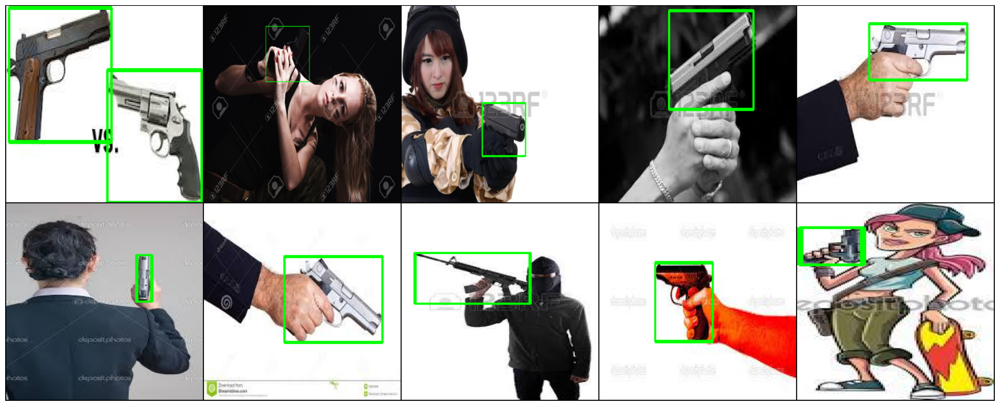

In [75]:
plt.figure(figsize=(24, 12))
grid_img = torchvision.utils.make_grid(sample_images, nrow=5)
#grid_img.shape
plt.imshow(grid_img.permute(1, 2, 0))
plt.axis('off');

## Weapon Detection with Detectron 2

It is time to go through the steps of fine-tuning a model using a custom dataset. But first, let's save 5% of the data for testing:

In [6]:
df = pd.read_csv('anns_weapons.csv')

IMAGES_PATH = f'weapons'

unique_files = df.file_name.unique()

train_files = set(np.random.choice(unique_files, int(len(unique_files) * 0.95), replace=False))
train_df = df[df.file_name.isin(train_files)]
test_df = df[~df.file_name.isin(train_files)]

train_df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,armas (1).jpeg,240,145,3,1,128,100,pistol
1,armas (1).jpeg,240,145,123,47,238,145,pistol
2,armas (10).jpeg,1300,913,409,95,697,352,pistol
3,armas (100).jpeg,450,300,184,148,283,229,pistol
4,armas (1000).jpeg,275,183,97,4,215,96,pistol


In [5]:
train_df.shape, test_df.shape

((3294, 8), (170, 8))

The classical train_test_split won't work here, cause we want a split amongst the file names. 

The next parts are written in a bit more generic way.

In [0]:
classes = df.class_name.unique().tolist()

In [9]:
classes

['pistol']

Next, we'll write a function that converts our dataset into a format that is used by Detectron2:

In [7]:
IMAGES_PATH

'weapons'

In [0]:
def create_dataset_dicts(df, classes):
  dataset_dicts = []
  for image_id, img_name in enumerate(df.file_name.unique()):

    record = {}

    image_df = df[df.file_name == img_name]

    file_path = f'{IMAGES_PATH}/{img_name}'
    record["file_name"] = file_path
    record["image_id"] = image_id
    record["height"] = int(image_df.iloc[0].height)
    record["width"] = int(image_df.iloc[0].width)

    objs = []
    for _, row in image_df.iterrows():

      xmin = int(row.x_min)
      ymin = int(row.y_min)
      xmax = int(row.x_max)
      ymax = int(row.y_max)

      poly = [
          (xmin, ymin), (xmax, ymin), 
          (xmax, ymax), (xmin, ymax)
      ]
      poly = list(itertools.chain.from_iterable(poly))

      obj = {
        "bbox": [xmin, ymin, xmax, ymax],
        "bbox_mode": BoxMode.XYXY_ABS,
        "segmentation": [poly],
        "category_id": classes.index(row.class_name),
        "iscrowd": 0
      }
      objs.append(obj)

    record["annotations"] = objs
    dataset_dicts.append(record)
  return dataset_dicts

We convert every annotation row to a single record with a list of annotations. You might also notice that we're building a polygon that is of the exact same shape as the bounding box. This is required for the image segmentation models in Detectron2.

You'll have to register your dataset into the dataset and metadata catalogues:

In [0]:
#DatasetCatalog._REGISTERED.clear()
#del DatasetCatalog._REGISTERED['weapons_train']
#del DatasetCatalog._REGISTERED['weapons_val']
print(DatasetCatalog._REGISTERED)
print(len(DatasetCatalog._REGISTERED))

In [0]:
entriesToRemove = ('weapons_train', 'weapons_val')
for k in entriesToRemove:
  DatasetCatalog._REGISTERED.pop(k, None)

In [0]:
for d in ["train", "val"]:
  DatasetCatalog.register("weapons_" + d, lambda d=d: create_dataset_dicts(train_df if d == "train" else test_df, classes))
  MetadataCatalog.get("weapons_" + d).set(thing_classes=classes)

statement_metadata = MetadataCatalog.get("weapons_train")

Unfortunately, evaluator for the test set is not included by default. We can easily fix that by writing our own trainer:

In [10]:
os.getcwd()

'/content/drive/My Drive/AIML/project'

In [0]:
class CocoTrainer(DefaultTrainer):
  
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"
        #output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    return COCOEvaluator(dataset_name, cfg, False, output_folder)

The evaluation results will be stored in the `coco_eval` folder if no folder is provided.

Fine-tuning a Detectron2 model is nothing like writing PyTorch code. We'll load a configuration file, change a few values, and start the training process. But hey, it really helps if you know what you're doing 😂

For this tutorial, we'll use the Mask R-CNN X101-FPN model. It is pre-trained on the [COCO dataset](http://cocodataset.org/#home) and achieves very good performance. The downside is that it is slow to train.

Let's load the config file and the pre-trained model weights:

In [0]:
cfg = get_cfg()

cfg.merge_from_file(
  model_zoo.get_config_file(
    "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
  )
)

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
  "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
)

In [0]:
#!wget https://github.com/Tony607/detectron2_instance_segmentation_demo/releases/download/V0.1/data.zip
#!unzip data.zip > /dev/null

In [0]:
#data_loader = build_detection_train_loader(cfg, mapper=custom_mapper)

Specify the datasets (we registered those) we'll use for training and evaluation:

In [0]:
cfg.DATASETS.TRAIN = ("weapons_train",) 
cfg.DATASETS.TEST = ("weapons_val",)
cfg.DATALOADER.NUM_WORKERS = 4
#cfg.INPUT.MIN_SIZE_TRAIN = (512,)
#cfg.INPUT.MAX_SIZE_TRAIN = 800
#cfg.INPUT.MIN_SIZE_TEST = 512
#cfg.INPUT.MAX_SIZE_TEST = 800

And for the optimizer, we'll do a bit of magic to converge to something nice:

In [0]:
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05

Except for the standard stuff (batch size, max number of iterations, and learning rate) we have a couple of interesting params:

- `WARMUP_ITERS` - the learning rate starts from 0 and goes to the preset one for this number of iterations
- `STEPS` - the checkpoints (number of iterations) at which the learning rate will be reduced by `GAMMA`

Finally, we'll specify the number of classes and the period at which we'll evaluate on the test set:

In [0]:
len(classes)

In [0]:
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 8
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)

cfg.TEST.EVAL_PERIOD = 500

Time to train, using our custom trainer:

In [15]:
#torch.cuda.empty_cache() 
print(torch.cuda.max_memory_allocated())
print(torch.cuda.max_memory_cached())

0
0


In [16]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[04/30 09:48:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:34, 12.4MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


[04/30 09:48:54 d2.engine.train_loop]: Starting training from iteration 0
[04/30 09:50:02 d2.utils.events]:  eta: 1:20:26  iter: 19  total_loss: 2.180  loss_cls: 0.594  loss_box_reg: 0.851  loss_mask: 0.685  loss_rpn_cls: 0.012  loss_rpn_loc: 0.011  time: 3.3121  data_time: 0.0841  lr: 0.000020  max_mem: 6274M
[04/30 09:51:10 d2.utils.events]:  eta: 1:21:07  iter: 39  total_loss: 2.046  loss_cls: 0.552  loss_box_reg: 0.886  loss_mask: 0.600  loss_rpn_cls: 0.006  loss_rpn_loc: 0.016  time: 3.3337  data_time: 0.0066  lr: 0.000040  max_mem: 6274M
[04/30 09:52:16 d2.utils.events]:  eta: 1:20:13  iter: 59  total_loss: 1.838  loss_cls: 0.460  loss_box_reg: 0.876  loss_mask: 0.511  loss_rpn_cls: 0.009  loss_rpn_loc: 0.011  time: 3.3368  data_time: 0.0067  lr: 0.000060  max_mem: 6274M
[04/30 09:53:21 d2.utils.events]:  eta: 1:16:25  iter: 79  total_loss: 1.738  loss_cls: 0.341  loss_box_reg: 0.884  loss_mask: 0.416  loss_rpn_cls: 0.005  loss_rpn_loc: 0.015  time: 3.3086  data_time: 0.0068  lr:

## Evaluating Object Detection Models

Evaluating object detection models is a bit different when compared to evaluating standard classification or regression models.

The main metric you need to know about is IoU (intersection over union). It measures the overlap between two boundaries - the predicted and ground truth one. It can get values between 0 and 1.

$$\text{IoU}=\frac{\text{area of overlap}}{\text{area of union}}$$

Using IoU, one can define a threshold (e.g. >0.5) to classify whether a prediction is a true positive (TP) or a false positive (FP).

Now you can calculate average precision (AP) by taking the area under the precision-recall curve.

Now AP@X (e.g. AP50) is just AP at some IoU threshold. This should give you a working understanding of how object detection models are evaluated.

I suggest you read the [mAP (mean Average Precision) for Object Detection](https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173) tutorial by Jonathan Hui if you want to learn more on the topic.

In [0]:
%load_ext tensorboard

In [18]:
%tensorboard --logdir output

<IPython.core.display.Javascript object>

We can start making predictions by loading the model and setting a minimum threshold of 85% certainty at which we'll consider the predictions as correct:

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

Let's run the evaluator with the trained model:

In [20]:
evaluator = COCOEvaluator("weapons_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "weapons_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

[04/30 11:24:38 d2.data.common]: Serializing 150 elements to byte tensors and concatenating them all ...
[04/30 11:24:38 d2.data.common]: Serialized dataset takes 0.04 MiB
[04/30 11:24:38 d2.evaluation.evaluator]: Start inference on 150 images
[04/30 11:24:46 d2.evaluation.evaluator]: Inference done 11/150. 0.7167 s / img. ETA=0:01:44
[04/30 11:24:51 d2.evaluation.evaluator]: Inference done 18/150. 0.7099 s / img. ETA=0:01:36
[04/30 11:24:56 d2.evaluation.evaluator]: Inference done 25/150. 0.7156 s / img. ETA=0:01:31
[04/30 11:25:02 d2.evaluation.evaluator]: Inference done 32/150. 0.7174 s / img. ETA=0:01:26
[04/30 11:25:07 d2.evaluation.evaluator]: Inference done 39/150. 0.7209 s / img. ETA=0:01:21
[04/30 11:25:12 d2.evaluation.evaluator]: Inference done 46/150. 0.7243 s / img. ETA=0:01:17
[04/30 11:25:18 d2.evaluation.evaluator]: Inference done 53/150. 0.7257 s / img. ETA=0:01:12
[04/30 11:25:23 d2.evaluation.evaluator]: Inference done 60/150. 0.7295 s / img. ETA=0:01:07
[04/30 11:25

OrderedDict([('bbox',
              {'AP': 62.104228148972894,
               'AP50': 87.90691652667391,
               'AP75': 71.44311905665856,
               'APl': 68.87544129656874,
               'APm': 33.824291276302745,
               'APs': 23.18695634745661}),
             ('segm',
              {'AP': 60.889277582251836,
               'AP50': 88.6231054127048,
               'AP75': 68.53589991208248,
               'APl': 67.73536893464393,
               'APm': 32.133049706281916,
               'APs': 18.776464411146996})])

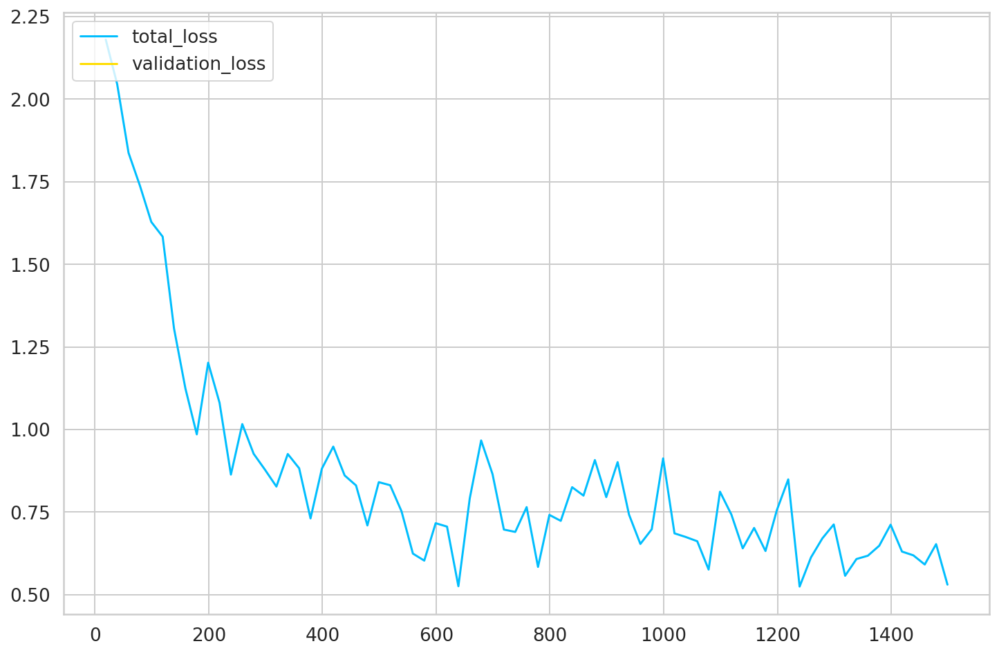

In [21]:
import json
import matplotlib.pyplot as plt

#experiment_folder = './output/model_iter4000_lr0005_wf1_date2020_03_20__05_16_45'
experiment_folder = './output/'

def load_json_arr(json_path):
    lines = []
    with open(json_path, 'r') as f:
        for line in f:
            lines.append(json.loads(line))
    return lines

experiment_metrics = load_json_arr(experiment_folder + 'metrics.json')

plt.plot(
    [x['iteration'] for x in experiment_metrics], 
    [x['total_loss'] for x in experiment_metrics])
plt.plot(
    [x['iteration'] for x in experiment_metrics if 'validation_loss' in x], 
    [x['validation_loss'] for x in experiment_metrics if 'validation_loss' in x])
plt.legend(['total_loss', 'validation_loss'], loc='upper left')
plt.show()

### Finding Faces in Images

Next, let's create a folder and save all images with predicted annotations in the test set:

In [0]:
!pwd

In [0]:
os.makedirs("weapons_results", exist_ok=True)

test_image_paths = test_df.file_name.unique()

In [23]:
test_df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
23,armas (1017).jpeg,183,275,71,60,109,108,pistol
37,armas (1029).jpeg,260,194,25,54,166,158,pistol
68,armas (1056).jpeg,1024,683,386,197,726,414,pistol
104,armas (1084).jpeg,450,319,49,110,248,241,pistol
150,armas (1115).jpeg,708,495,201,295,234,364,pistol


In [24]:
test_df[test_df.file_name == 'armas (1115).jpeg']

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
150,armas (1115).jpeg,708,495,201,295,234,364,pistol


In [25]:
for clothing_image in test_image_paths:
  print(clothing_image)
  file_path = f'{IMAGES_PATH}/{clothing_image}'
  im = cv2.imread(file_path)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  print(instances)
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'weapons_results/{file_name}', result)

armas (1017).jpeg
Instances(num_instances=1, image_height=275, image_width=183, fields=[pred_boxes: Boxes(tensor([[ 73.1440,  61.3462, 110.0966, 104.5952]])), scores: tensor([0.9885]), pred_classes: tensor([0])])
armas (1029).jpeg
Instances(num_instances=2, image_height=194, image_width=260, fields=[pred_boxes: Boxes(tensor([[ 26.4705,  50.9741, 183.6277, 166.0752],
        [121.8796,  55.2015, 174.6247, 113.8535]])), scores: tensor([0.9668, 0.9259]), pred_classes: tensor([0, 0])])
armas (1056).jpeg
Instances(num_instances=2, image_height=683, image_width=1024, fields=[pred_boxes: Boxes(tensor([[380.1310, 182.9539, 732.6180, 406.8288],
        [351.7751, 174.9494, 746.7416, 596.6595]])), scores: tensor([0.9904, 0.8964]), pred_classes: tensor([0, 0])])
armas (1084).jpeg
Instances(num_instances=1, image_height=319, image_width=450, fields=[pred_boxes: Boxes(tensor([[ 54.6488, 105.9988, 232.8492, 249.9301]])), scores: tensor([0.9876]), pred_classes: tensor([0])])
armas (1115).jpeg
Instanc

Let's have a look:

In [0]:
annotated_images = [f'weapons_results/{f}' for f in test_df.file_name.unique()]

In [27]:
annotated_images[10]

'weapons_results/armas (1215).jpeg'

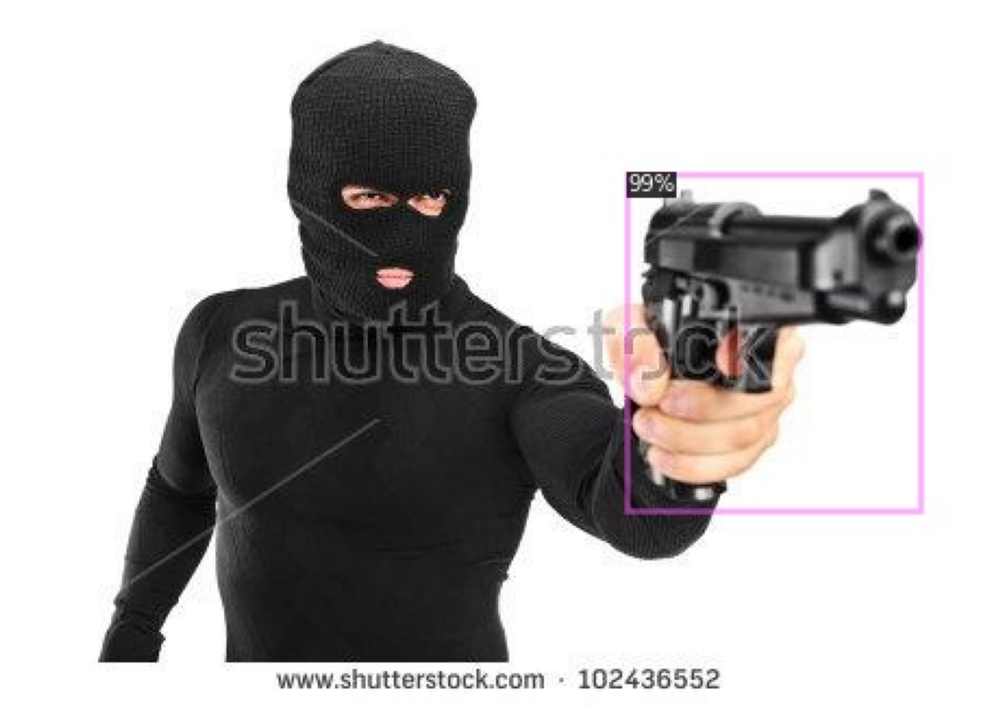

In [33]:
img = cv2.cvtColor(cv2.imread(annotated_images[50]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

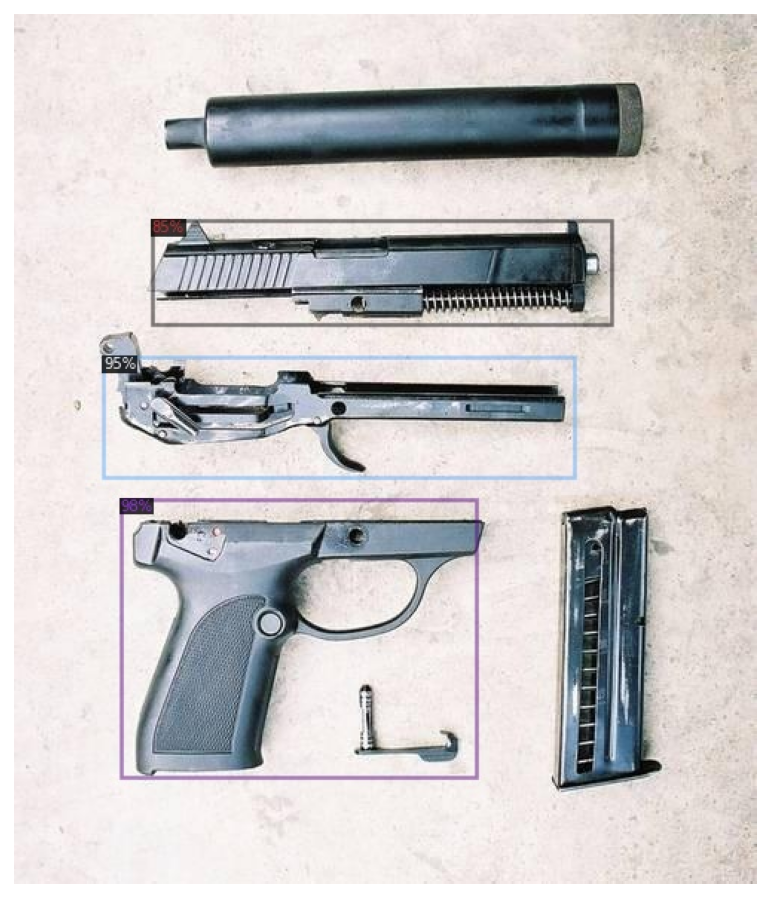

In [29]:
img = cv2.cvtColor(cv2.imread(annotated_images[11]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

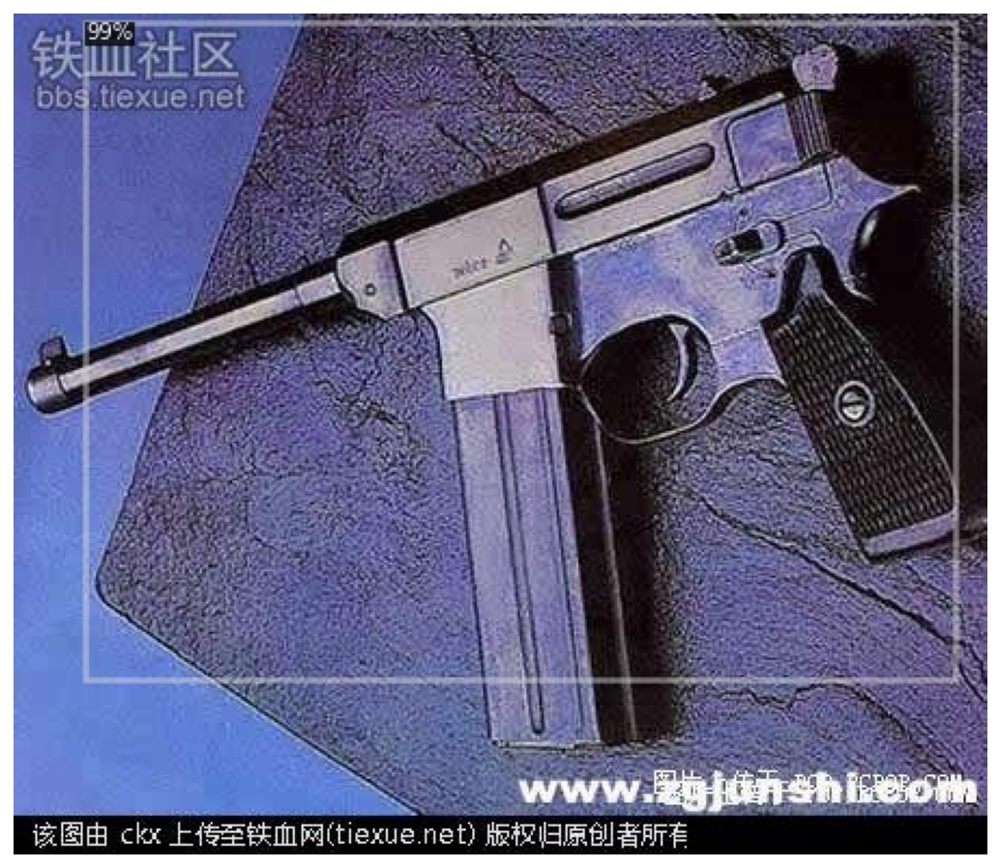

In [30]:
img = cv2.cvtColor(cv2.imread(annotated_images[13]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

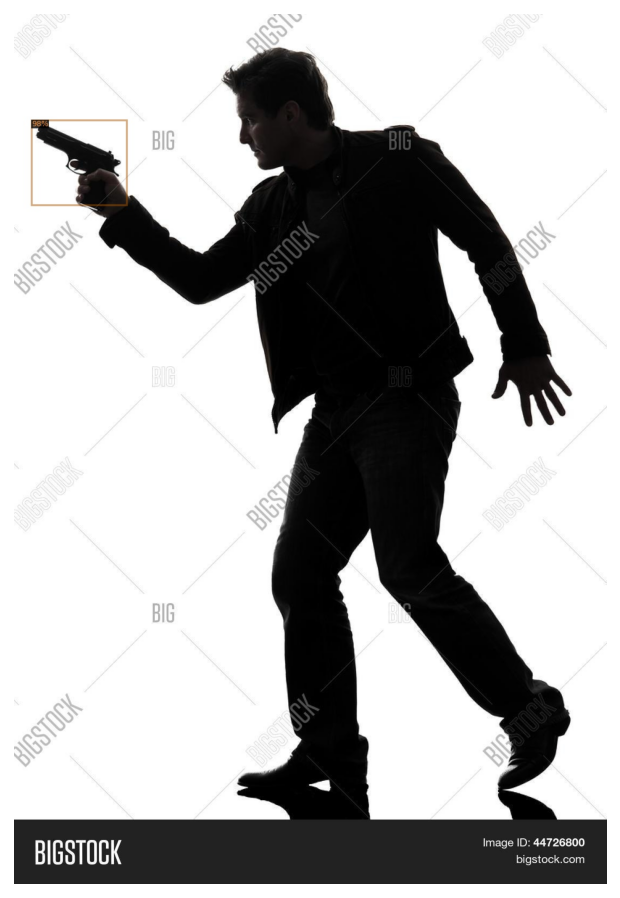

In [31]:
img = cv2.cvtColor(cv2.imread(annotated_images[14]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

In [0]:
def process_img_testdata(data_path, new_data_path):
  folder = os.fsencode(data_path)
  for file in os.listdir(folder):
    fileName = os.fsdecode(file)
    img = os.path.join(data_path, fileName)
    img = Image.open(img)
    img = img.convert('RGB')
    image_name = f'{fileName[:-4]}.jpeg'
    img.save(f'{new_data_path}/{image_name}', "JPEG")

In [0]:
os.makedirs("weapons_test", exist_ok=True)

In [0]:
process_img_testdata('Test','weapons_test')

In [0]:
os.makedirs("weapons_test_results", exist_ok=True)

In [0]:
import os
path = 'weapons_test'
folder = os.fsencode(path)
test_images = []

for file in os.listdir(folder):
    filename = os.fsdecode(file)
    test_images.append(filename)

test_images.sort()

In [42]:
len(test_images)

608

In [43]:
test_images[0]

'frame1.jpeg'

In [44]:
IMAGES_PATH = 'weapons_test'
for clothing_image in test_images:
  print(clothing_image)
  file_path = f'{IMAGES_PATH}/{clothing_image}'
  im = cv2.imread(file_path)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  print(instances)
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'weapons_test_results/{file_name}', result)

frame1.jpeg
Instances(num_instances=1, image_height=120, image_width=160, fields=[pred_boxes: Boxes(tensor([[  0.3991,   4.9930, 132.1518, 116.4889]])), scores: tensor([0.8608]), pred_classes: tensor([0])])
frame10.jpeg
Instances(num_instances=1, image_height=120, image_width=160, fields=[pred_boxes: Boxes(tensor([[  0.0000,   0.0000, 155.6604, 115.9437]])), scores: tensor([0.9113]), pred_classes: tensor([0])])
frame100.jpeg
Instances(num_instances=0, image_height=120, image_width=160, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=torch.int64)])
frame101.jpeg
Instances(num_instances=1, image_height=120, image_width=160, fields=[pred_boxes: Boxes(tensor([[ 79.7238,  58.7356, 100.9899,  73.8538]])), scores: tensor([0.8864]), pred_classes: tensor([0])])
frame102.jpeg
Instances(num_instances=0, image_height=120, image_width=160, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=tor

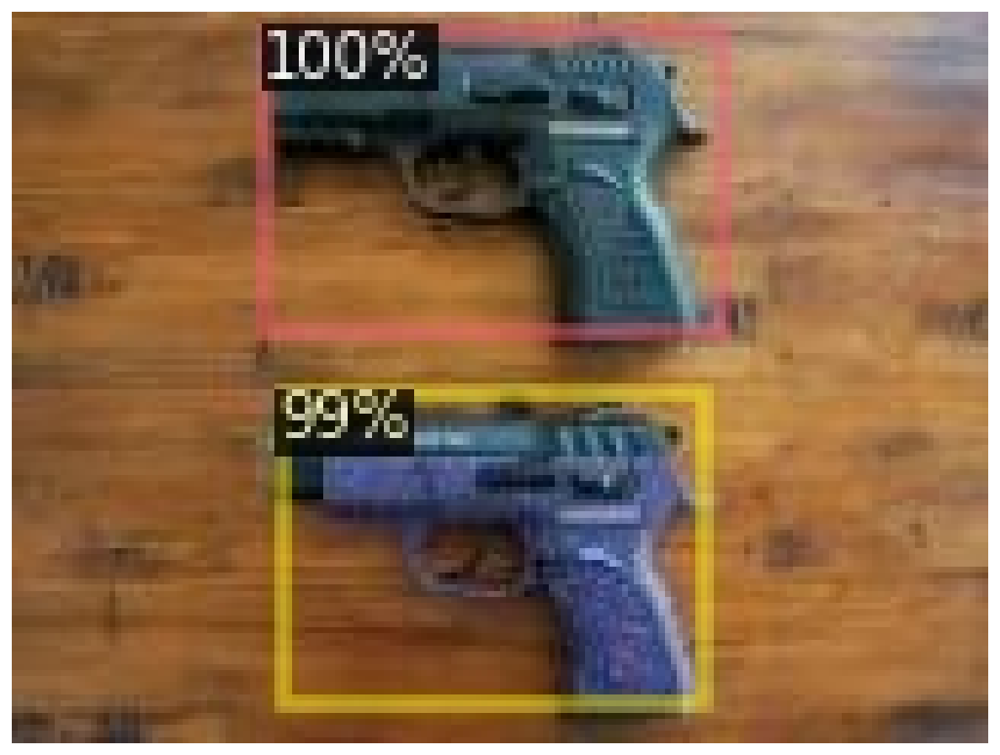

In [45]:
img = cv2.cvtColor(cv2.imread('weapons_test_results/frame519.jpeg'), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

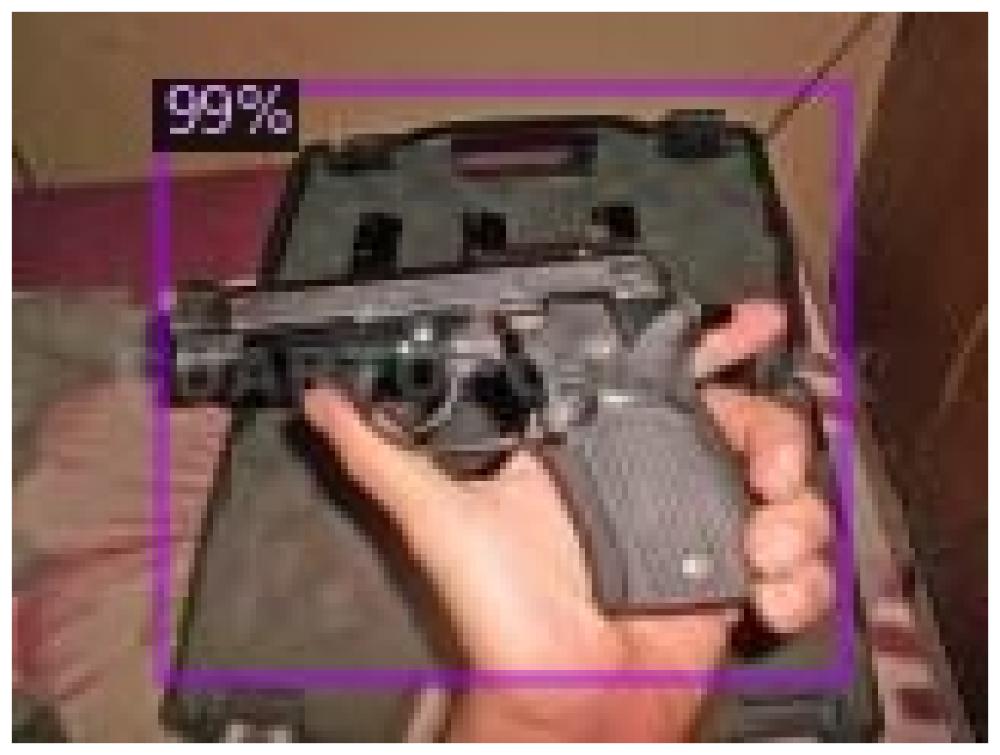

In [46]:
img = cv2.cvtColor(cv2.imread('weapons_test_results/frame477.jpeg'), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

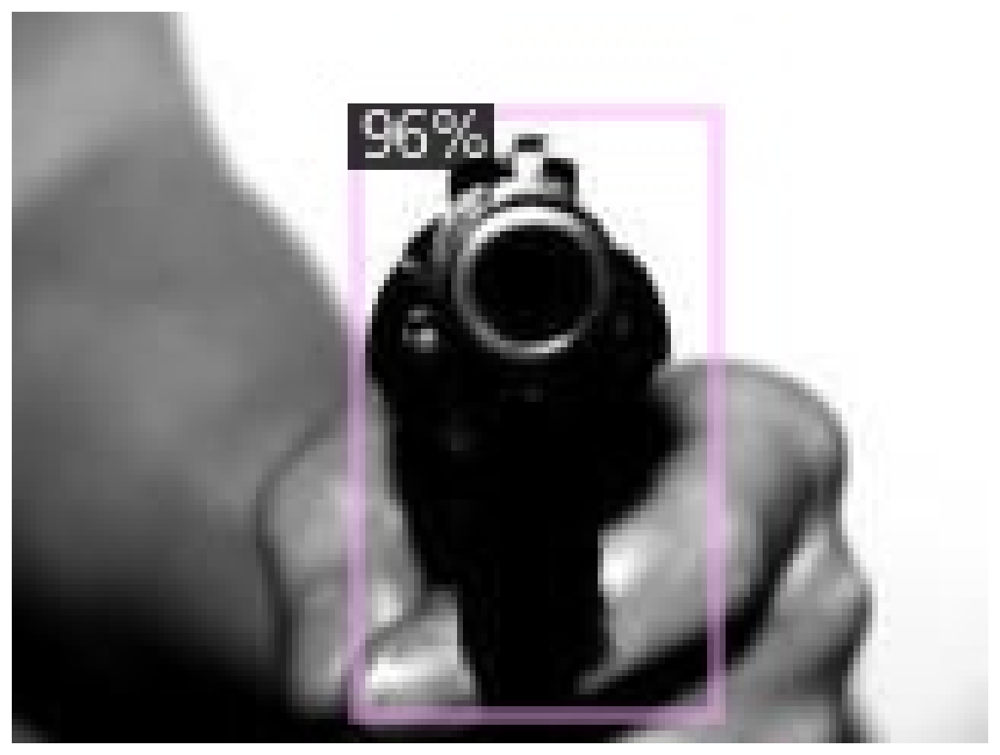

In [47]:
img = cv2.cvtColor(cv2.imread('weapons_test_results/frame574.jpeg'), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

Not bad. Not bad at all.

## References

- [Face Detection in Images](https://www.kaggle.com/dataturks/face-detection-in-images)
- [Detectron2 on GitHub](https://github.com/facebookresearch/detectron2/)
- [mAP (mean Average Precision) for Object Detection](https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173)